In [10]:
import os
import time
import gc
import json
import datetime
import warnings
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

os.chdir('../src')

from paths import *
import util.util_functions as util
import util.log_functions as log

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
slide_size = 50000

In [3]:
# load basic features
train_features = pd.read_csv(FEATURES_DIR / f'lanl-features-{slide_size}/train_features_{slide_size}.csv')
test_features = pd.read_csv(FEATURES_DIR / f'lanl-features-{slide_size}/test_features.csv')

# Load denoised features
train_features_denoised = pd.read_csv(FEATURES_DIR / f'lanl-features-{slide_size}/train_features_denoised_{slide_size}.csv')
test_features_denoised = pd.read_csv(FEATURES_DIR / f'lanl-features-{slide_size}/test_features_denoised.csv')
train_features_denoised.columns = [f'{i}_denoised' for i in train_features_denoised.columns]
test_features_denoised.columns = [f'{i}_denoised' for i in test_features_denoised.columns]

# Concat features
X = pd.concat([train_features, train_features_denoised], axis=1)[:-1]
y = pd.read_csv(FEATURES_DIR / f'lanl-features-{slide_size}/y_{slide_size}.csv')[:-1]

In [5]:
df_corr = X.corr()

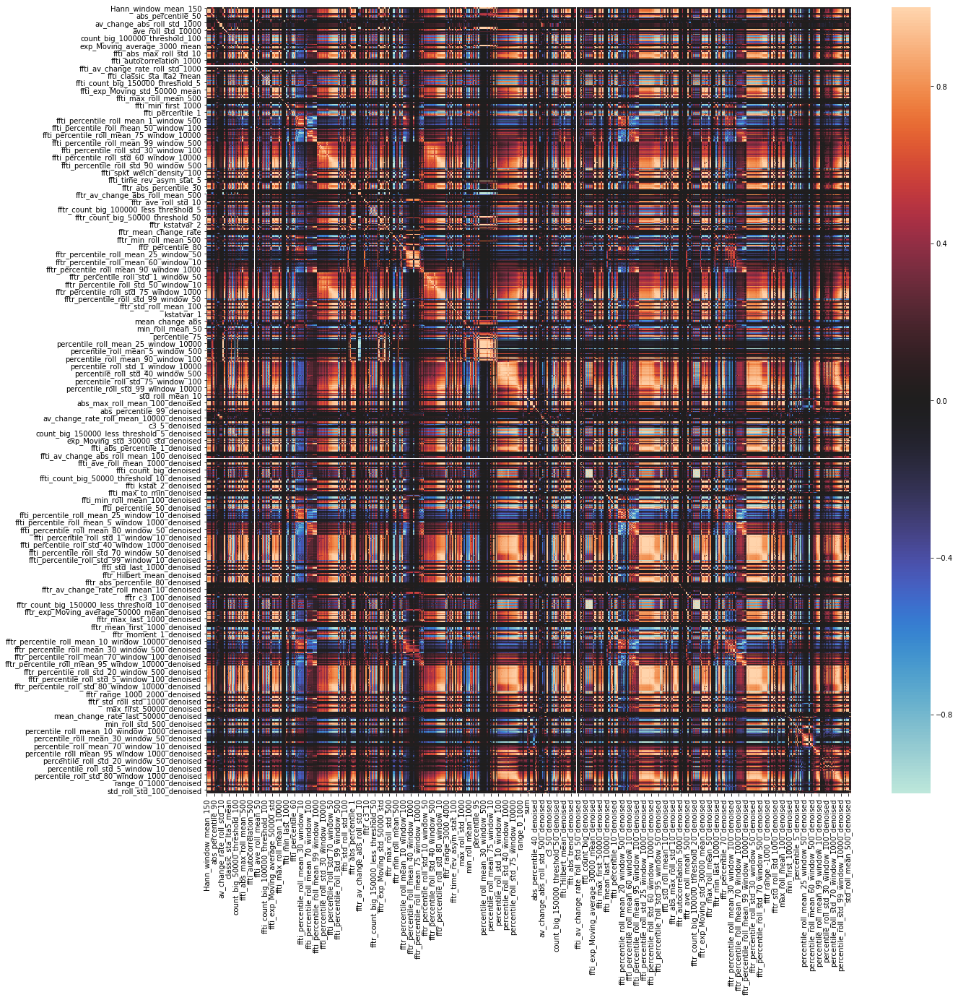

In [12]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_corr, vmax=1, vmin=-1, center=0)

In [40]:
th  = 0.975

retained_features = []
removed_features = []
features = df_corr.index.tolist()
for feature1 in features:
    if feature1 in removed_features:
        continue
    else:
        retained_features.append(feature1)
    
    for feature2 in features:
        if feature1 == feature2:
            continue
        
        if df_corr.loc[feature1, feature2] > th:
            removed_features.append(feature2)

df_corr_after = X[retained_features].corr()

plt.figure(figsize=(20, 20))
sns.heatmap(df_corr_after, vmax=1, vmin=-1, center=0)

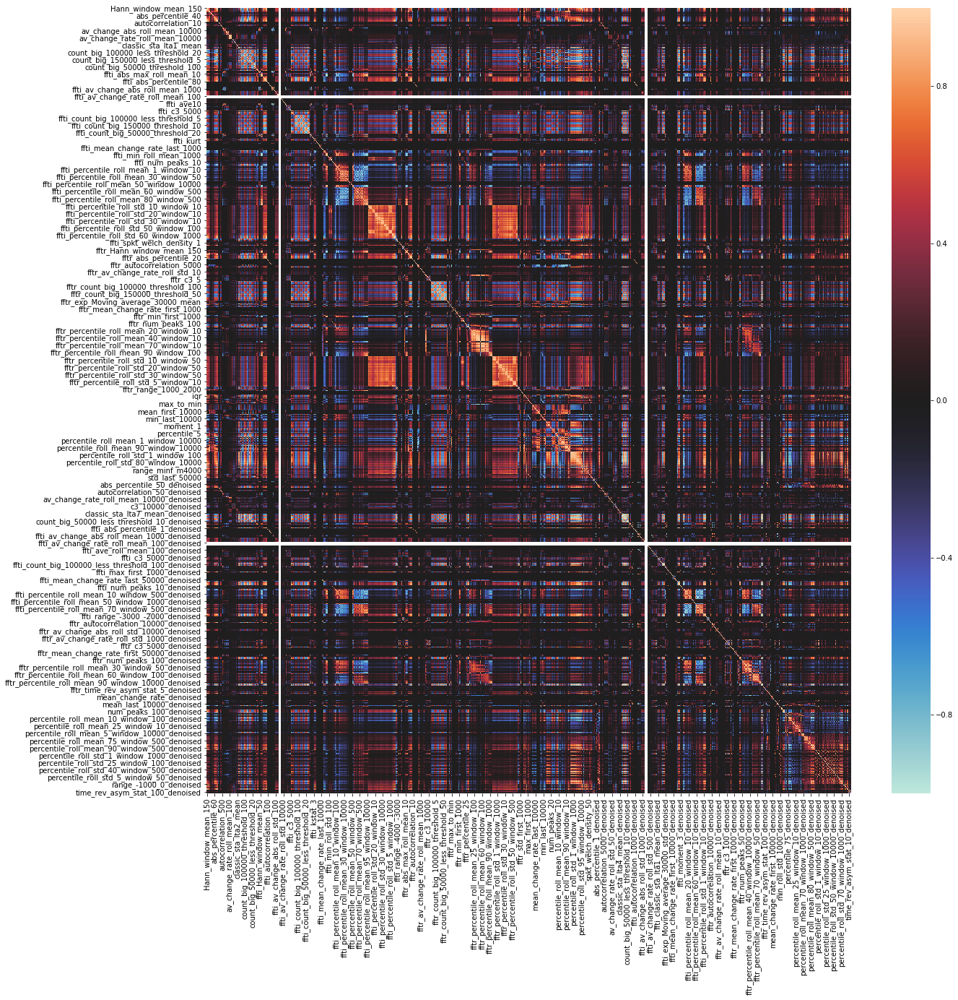

708


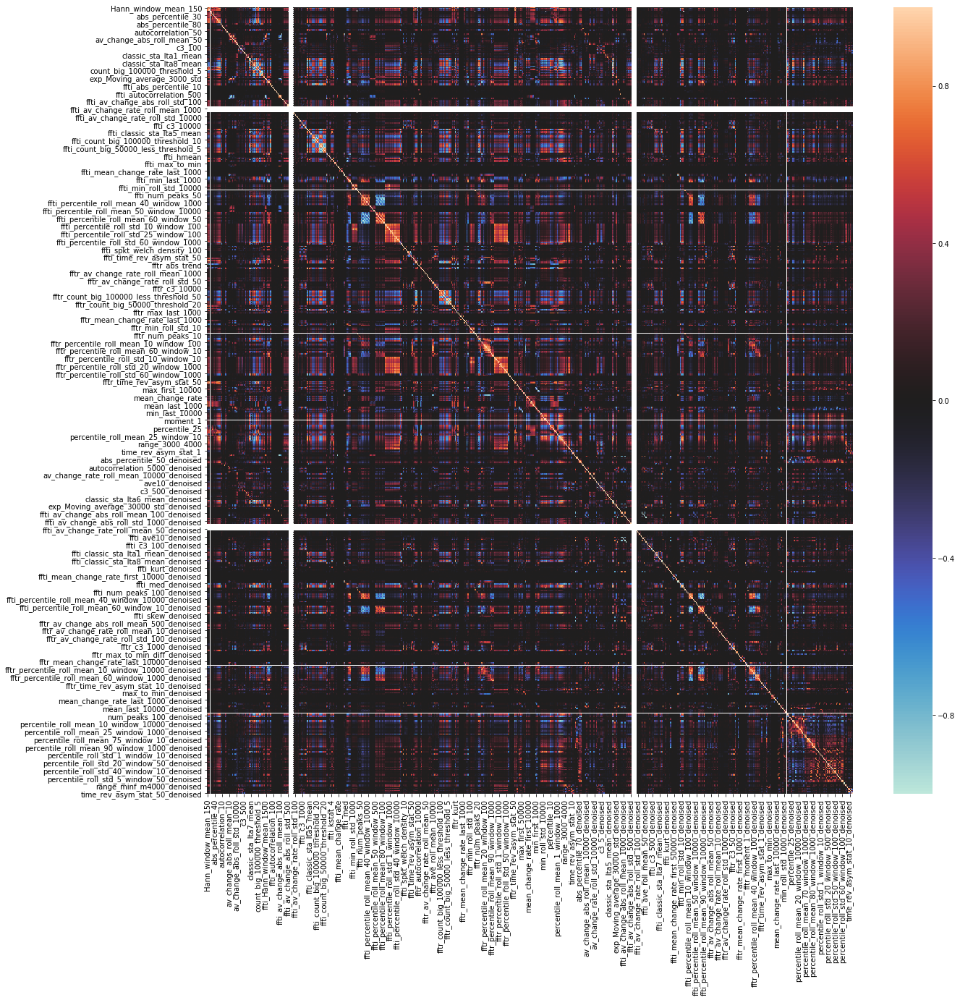

In [46]:
th  = 0.9

retained_features = []
removed_features = []
features = df_corr.index.tolist()
for feature1 in features:
    if feature1 in removed_features:
        continue
    else:
        retained_features.append(feature1)
    
    for feature2 in features:
        if feature1 == feature2:
            continue
        
        if df_corr.loc[feature1, feature2] > th:
            removed_features.append(feature2)

print(len(retained_features))
df_corr_after = X[retained_features].corr()

plt.figure(figsize=(20, 20))
sns.heatmap(df_corr_after, vmax=1, vmin=-1, center=0)

620


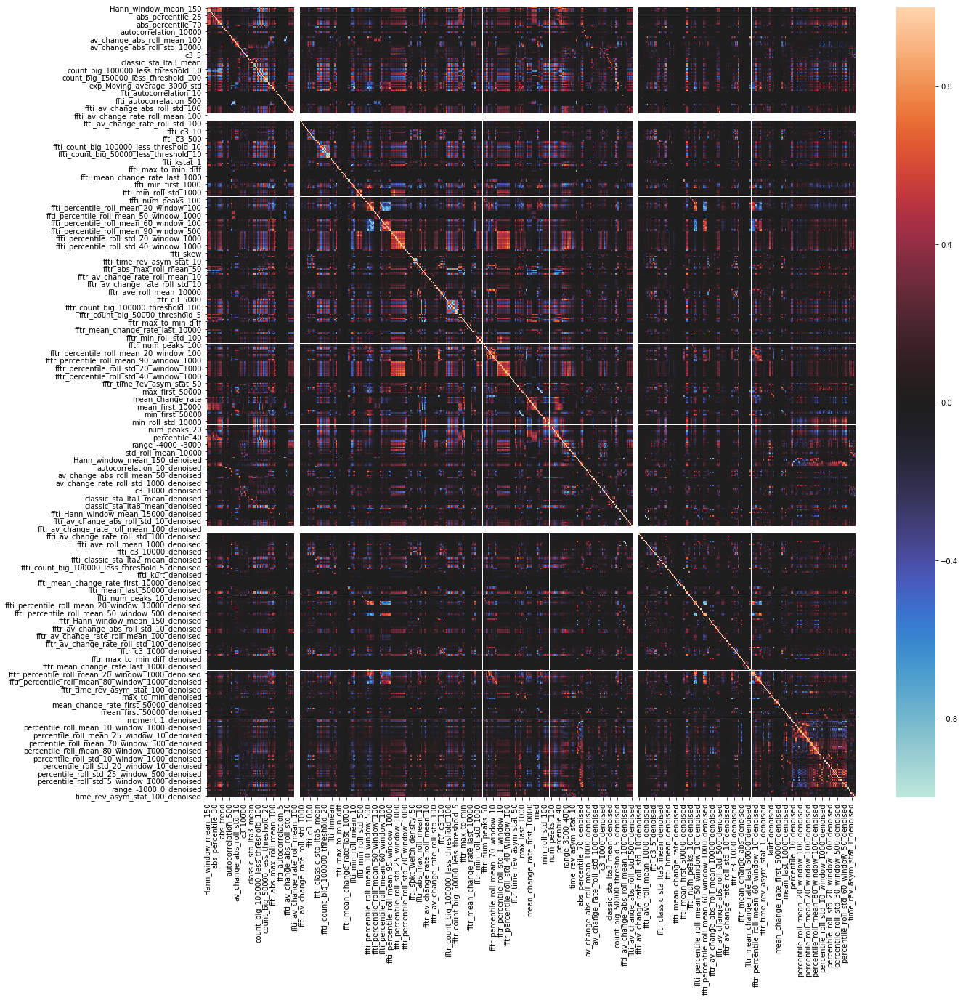

In [47]:
th  = 0.85

retained_features = []
removed_features = []
features = df_corr.index.tolist()
for feature1 in features:
    if feature1 in removed_features:
        continue
    else:
        retained_features.append(feature1)
    
    for feature2 in features:
        if feature1 == feature2:
            continue
        
        if df_corr.loc[feature1, feature2] > th:
            removed_features.append(feature2)

print(len(retained_features))
df_corr_after = X[retained_features].corr()

plt.figure(figsize=(20, 20))
sns.heatmap(df_corr_after, vmax=1, vmin=-1, center=0)

In [36]:
th = 0.975
indices = df_corr.index.tolist()
high_corr_feature_dict = {}
for i, corr_vals in enumerate(df_corr.values):
    for j, corr_val in enumerate(corr_vals):
        feature1 = indices[i]
        feature2 = indices[j]
        if i != j and corr_val > th:
            if not feature1 in high_corr_feature_dict.keys():
                high_corr_feature_dict[feature1] = [feature2]
            else:
                if feature2 in high_corr_feature_dict.keys():
                    if feature1 in high_corr_feature_dict[feature2]:
                        print(feature1, feature2)
                        continue
                high_corr_feature_dict[feature1] .append(feature2)
    

Hann_window_mean_15000 Hann_window_mean_1500
Hann_window_mean_50 Hann_window_mean_1500
Hann_window_mean_50 Hann_window_mean_15000
abs_max_roll_mean_500 abs_max_roll_mean_50
abs_max_roll_std_10 abs_max_roll_mean_10
abs_max_roll_std_100 abs_max_roll_mean_10
abs_max_roll_std_100 abs_max_roll_std_10
abs_max_roll_std_1000 abs_max_roll_mean_10
abs_max_roll_std_1000 abs_max_roll_mean_100
abs_max_roll_std_1000 abs_max_roll_mean_50
abs_max_roll_std_1000 abs_max_roll_std_10
abs_max_roll_std_1000 abs_max_roll_std_100
abs_max_roll_std_10000 abs_max_roll_mean_100
abs_max_roll_std_10000 abs_max_roll_std_10
abs_max_roll_std_10000 abs_max_roll_std_100
abs_max_roll_std_10000 abs_max_roll_std_1000
abs_max_roll_std_50 abs_max_roll_mean_10
abs_max_roll_std_50 abs_max_roll_std_10
abs_max_roll_std_50 abs_max_roll_std_100
abs_max_roll_std_50 abs_max_roll_std_1000
abs_max_roll_std_50 abs_max_roll_std_10000
abs_max_roll_std_500 abs_max_roll_mean_10
abs_max_roll_std_500 abs_max_roll_mean_100
abs_max_roll_std_50

ffti_abs_max_roll_std_100 abs_max_roll_std_10000
ffti_abs_max_roll_std_100 abs_std
ffti_abs_max_roll_std_100 exp_Moving_std_3000_std
ffti_abs_max_roll_std_100 exp_Moving_std_300_std
ffti_abs_max_roll_std_100 ffti_Hilbert_mean
ffti_abs_max_roll_std_100 ffti_abs_max
ffti_abs_max_roll_std_100 ffti_abs_max_roll_std_10
ffti_abs_max_roll_std_1000 abs_max_roll_std_1000
ffti_abs_max_roll_std_1000 abs_max_roll_std_10000
ffti_abs_max_roll_std_1000 abs_max_roll_std_500
ffti_abs_max_roll_std_1000 abs_std
ffti_abs_max_roll_std_1000 exp_Moving_std_3000_std
ffti_abs_max_roll_std_1000 exp_Moving_std_300_std
ffti_abs_max_roll_std_1000 ffti_Hilbert_mean
ffti_abs_max_roll_std_1000 ffti_abs_max
ffti_abs_max_roll_std_1000 ffti_abs_max_roll_std_10
ffti_abs_max_roll_std_1000 ffti_abs_max_roll_std_100
ffti_abs_max_roll_std_10000 abs_max_roll_std_10
ffti_abs_max_roll_std_10000 abs_max_roll_std_1000
ffti_abs_max_roll_std_10000 abs_max_roll_std_10000
ffti_abs_max_roll_std_10000 abs_max_roll_std_500
ffti_abs_max_

ffti_exp_Moving_average_300_std ffti_abs_max_roll_mean_500
ffti_exp_Moving_std_30000_mean abs_max_roll_std_10000
ffti_exp_Moving_std_30000_mean abs_max_roll_std_500
ffti_exp_Moving_std_30000_mean abs_std
ffti_exp_Moving_std_30000_mean count_big_150000_threshold_100
ffti_exp_Moving_std_30000_mean exp_Moving_std_30000_std
ffti_exp_Moving_std_30000_mean exp_Moving_std_3000_std
ffti_exp_Moving_std_30000_mean exp_Moving_std_300_std
ffti_exp_Moving_std_30000_mean ffti_Hilbert_mean
ffti_exp_Moving_std_30000_mean ffti_abs_max
ffti_exp_Moving_std_30000_mean ffti_abs_max_roll_std_100
ffti_exp_Moving_std_30000_mean ffti_abs_max_roll_std_1000
ffti_exp_Moving_std_30000_mean ffti_abs_max_roll_std_10000
ffti_exp_Moving_std_30000_mean ffti_abs_max_roll_std_50
ffti_exp_Moving_std_30000_mean ffti_abs_max_roll_std_500
ffti_exp_Moving_std_30000_mean ffti_abs_mean
ffti_exp_Moving_std_30000_mean ffti_abs_percentile_90
ffti_exp_Moving_std_30000_mean ffti_abs_percentile_95
ffti_exp_Moving_std_30000_mean ffti_

ffti_moment_2 ffti_kstat_2
ffti_moment_2 ffti_kstat_4
ffti_moment_2 ffti_kstatvar_1
ffti_moment_2 ffti_kstatvar_2
ffti_moment_4 ffti_kstat_4
ffti_moment_4 ffti_kstatvar_1
ffti_moment_4 ffti_kstatvar_2
ffti_moment_4 ffti_moment_2
ffti_percentile_1 ffti_min
ffti_percentile_1 ffti_min_first_10000
ffti_percentile_1 ffti_min_first_50000
ffti_percentile_1 ffti_min_last_10000
ffti_percentile_1 ffti_min_last_50000
ffti_percentile_30 ffti_percentile_25
ffti_percentile_40 ffti_percentile_25
ffti_percentile_40 ffti_percentile_30
ffti_percentile_5 ffti_percentile_10
ffti_percentile_60 ffti_abs_percentile_25
ffti_percentile_60 ffti_abs_percentile_30
ffti_percentile_60 ffti_abs_percentile_40
ffti_percentile_60 ffti_abs_percentile_50
ffti_percentile_60 ffti_abs_percentile_60
ffti_percentile_60 ffti_iqr
ffti_percentile_70 ffti_abs_percentile_25
ffti_percentile_70 ffti_abs_percentile_30
ffti_percentile_70 ffti_abs_percentile_40
ffti_percentile_70 ffti_abs_percentile_50
ffti_percentile_70 ffti_abs_perce

ffti_std ffti_max_first_50000
ffti_std ffti_max_last_10000
ffti_std ffti_max_last_50000
ffti_std ffti_max_roll_std_100
ffti_std ffti_max_roll_std_1000
ffti_std ffti_max_roll_std_10000
ffti_std ffti_max_roll_std_50
ffti_std ffti_max_roll_std_500
ffti_std ffti_percentile_95
ffti_std ffti_percentile_99
ffti_std ffti_percentile_roll_std_90_window_10
ffti_std ffti_percentile_roll_std_90_window_100
ffti_std ffti_percentile_roll_std_90_window_1000
ffti_std ffti_percentile_roll_std_90_window_10000
ffti_std ffti_percentile_roll_std_90_window_50
ffti_std ffti_percentile_roll_std_90_window_500
ffti_std ffti_percentile_roll_std_95_window_10
ffti_std ffti_percentile_roll_std_95_window_100
ffti_std ffti_percentile_roll_std_95_window_1000
ffti_std ffti_percentile_roll_std_95_window_10000
ffti_std ffti_percentile_roll_std_95_window_50
ffti_std ffti_percentile_roll_std_95_window_500
ffti_std ffti_percentile_roll_std_99_window_10
ffti_std ffti_percentile_roll_std_99_window_100
ffti_std ffti_percentile_r

fftr_Hann_window_mean_15000 fftr_Hann_window_mean_1500
fftr_Hann_window_mean_50 fftr_Hann_window_mean_1500
fftr_Hann_window_mean_50 fftr_Hann_window_mean_15000
fftr_Hilbert_mean abs_max_roll_std_10000
fftr_Hilbert_mean abs_max_roll_std_500
fftr_Hilbert_mean abs_std
fftr_Hilbert_mean count_big_150000_threshold_100
fftr_Hilbert_mean exp_Moving_std_30000_std
fftr_Hilbert_mean exp_Moving_std_3000_std
fftr_Hilbert_mean exp_Moving_std_300_std
fftr_Hilbert_mean ffti_Hilbert_mean
fftr_Hilbert_mean ffti_abs_max
fftr_Hilbert_mean ffti_abs_max_roll_std_100
fftr_Hilbert_mean ffti_abs_max_roll_std_1000
fftr_Hilbert_mean ffti_abs_max_roll_std_10000
fftr_Hilbert_mean ffti_abs_max_roll_std_50
fftr_Hilbert_mean ffti_abs_max_roll_std_500
fftr_Hilbert_mean ffti_abs_mean
fftr_Hilbert_mean ffti_abs_percentile_80
fftr_Hilbert_mean ffti_abs_percentile_90
fftr_Hilbert_mean ffti_abs_percentile_95
fftr_Hilbert_mean ffti_abs_percentile_99
fftr_Hilbert_mean ffti_abs_std
fftr_Hilbert_mean ffti_abs_trend
fftr_Hilbe

fftr_ave_roll_mean_1000 fftr_ave_roll_mean_10
fftr_ave_roll_mean_1000 fftr_ave_roll_mean_100
fftr_ave_roll_mean_50 fftr_Hann_window_mean_1500
fftr_ave_roll_mean_50 fftr_Hann_window_mean_15000
fftr_ave_roll_mean_50 fftr_Hann_window_mean_50
fftr_ave_roll_mean_50 fftr_ave_roll_mean_10
fftr_ave_roll_mean_50 fftr_ave_roll_mean_100
fftr_ave_roll_mean_50 fftr_ave_roll_mean_1000
fftr_ave_roll_mean_500 fftr_Hann_window_mean_1500
fftr_ave_roll_mean_500 fftr_Hann_window_mean_15000
fftr_ave_roll_mean_500 fftr_Hann_window_mean_50
fftr_ave_roll_mean_500 fftr_ave_roll_mean_10
fftr_ave_roll_mean_500 fftr_ave_roll_mean_100
fftr_ave_roll_mean_500 fftr_ave_roll_mean_1000
fftr_ave_roll_mean_500 fftr_ave_roll_mean_50
fftr_ave_roll_std_10 abs_std
fftr_ave_roll_std_10 exp_Moving_std_3000_std
fftr_ave_roll_std_10 exp_Moving_std_300_std
fftr_ave_roll_std_10 ffti_Hilbert_mean
fftr_ave_roll_std_10 ffti_abs_max_roll_std_10
fftr_ave_roll_std_10 ffti_abs_max_roll_std_1000
fftr_ave_roll_std_10 ffti_abs_max_roll_std_

fftr_exp_Moving_std_3000_std abs_std
fftr_exp_Moving_std_3000_std exp_Moving_average_300_std
fftr_exp_Moving_std_3000_std exp_Moving_std_3000_std
fftr_exp_Moving_std_3000_std exp_Moving_std_300_std
fftr_exp_Moving_std_3000_std ffti_Hilbert_mean
fftr_exp_Moving_std_3000_std ffti_abs_mean
fftr_exp_Moving_std_3000_std ffti_abs_percentile_90
fftr_exp_Moving_std_3000_std ffti_abs_percentile_95
fftr_exp_Moving_std_3000_std ffti_abs_std
fftr_exp_Moving_std_3000_std ffti_abs_trend
fftr_exp_Moving_std_3000_std ffti_ave_roll_std_100
fftr_exp_Moving_std_3000_std ffti_ave_roll_std_1000
fftr_exp_Moving_std_3000_std ffti_ave_roll_std_500
fftr_exp_Moving_std_3000_std ffti_exp_Moving_std_30000_mean
fftr_exp_Moving_std_3000_std ffti_exp_Moving_std_3000_mean
fftr_exp_Moving_std_3000_std ffti_exp_Moving_std_300_mean
fftr_exp_Moving_std_3000_std ffti_exp_Moving_std_50000_mean
fftr_exp_Moving_std_3000_std ffti_iqr1
fftr_exp_Moving_std_3000_std ffti_kstat_2
fftr_exp_Moving_std_3000_std ffti_kstatvar_1
fftr_

fftr_min ffti_min_first_10000
fftr_min ffti_min_first_50000
fftr_min ffti_min_last_10000
fftr_min ffti_min_last_50000
fftr_min ffti_percentile_1
fftr_min_first_10000 ffti_min_first_10000
fftr_min_first_10000 ffti_min_first_50000
fftr_min_first_10000 ffti_min_last_10000
fftr_min_first_10000 ffti_min_last_50000
fftr_min_first_10000 ffti_percentile_1
fftr_min_first_10000 fftr_min
fftr_min_first_50000 ffti_min_first_10000
fftr_min_first_50000 ffti_min_first_50000
fftr_min_first_50000 ffti_min_last_10000
fftr_min_first_50000 ffti_min_last_50000
fftr_min_first_50000 ffti_percentile_1
fftr_min_first_50000 fftr_min
fftr_min_first_50000 fftr_min_first_10000
fftr_min_last_10000 ffti_min_first_10000
fftr_min_last_10000 ffti_min_first_50000
fftr_min_last_10000 ffti_min_last_10000
fftr_min_last_10000 ffti_min_last_50000
fftr_min_last_10000 ffti_percentile_1
fftr_min_last_10000 fftr_min
fftr_min_last_10000 fftr_min_first_10000
fftr_min_last_10000 fftr_min_first_50000
fftr_min_last_50000 ffti_min_fir

fftr_percentile_roll_mean_90_window_50 fftr_percentile_roll_mean_90_window_100
fftr_percentile_roll_mean_95_window_10 ffti_percentile_roll_mean_99_window_10
fftr_percentile_roll_mean_95_window_10 ffti_std_roll_mean_10
fftr_percentile_roll_mean_95_window_100 ffti_percentile_roll_mean_90_window_100
fftr_percentile_roll_mean_95_window_100 ffti_percentile_roll_mean_95_window_100
fftr_percentile_roll_mean_95_window_100 ffti_percentile_roll_mean_99_window_100
fftr_percentile_roll_mean_95_window_100 ffti_std_roll_mean_100
fftr_percentile_roll_mean_95_window_50 ffti_percentile_roll_mean_95_window_50
fftr_percentile_roll_mean_95_window_50 ffti_percentile_roll_mean_99_window_50
fftr_percentile_roll_mean_95_window_50 ffti_std_roll_mean_50
fftr_percentile_roll_mean_95_window_50 fftr_percentile_roll_mean_90_window_50
fftr_percentile_roll_mean_95_window_500 ffti_percentile_roll_mean_99_window_1000
fftr_percentile_roll_mean_95_window_500 ffti_percentile_roll_mean_99_window_500
fftr_percentile_roll_me

fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_90_window_10
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_90_window_100
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_90_window_1000
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_90_window_10000
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_90_window_50
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_90_window_500
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_95_window_10
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_95_window_100
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_95_window_1000
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_95_window_10000
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_95_window_50
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_std_95_window_500
fftr_percentile_roll_std_95_window_100 ffti_percentile_roll_st

fftr_percentile_roll_std_99_window_50 ffti_max_last_10000
fftr_percentile_roll_std_99_window_50 ffti_max_last_50000
fftr_percentile_roll_std_99_window_50 ffti_max_roll_std_10
fftr_percentile_roll_std_99_window_50 ffti_max_roll_std_100
fftr_percentile_roll_std_99_window_50 ffti_max_roll_std_1000
fftr_percentile_roll_std_99_window_50 ffti_max_roll_std_10000
fftr_percentile_roll_std_99_window_50 ffti_max_roll_std_50
fftr_percentile_roll_std_99_window_50 ffti_max_roll_std_500
fftr_percentile_roll_std_99_window_50 ffti_percentile_95
fftr_percentile_roll_std_99_window_50 ffti_percentile_99
fftr_percentile_roll_std_99_window_50 ffti_percentile_roll_std_90_window_10
fftr_percentile_roll_std_99_window_50 ffti_percentile_roll_std_90_window_100
fftr_percentile_roll_std_99_window_50 ffti_percentile_roll_std_90_window_1000
fftr_percentile_roll_std_99_window_50 ffti_percentile_roll_std_90_window_10000
fftr_percentile_roll_std_99_window_50 ffti_percentile_roll_std_90_window_50
fftr_percentile_roll_st

fftr_std_roll_std_10 abs_max_roll_std_10000
fftr_std_roll_std_10 abs_std
fftr_std_roll_std_10 exp_Moving_std_3000_std
fftr_std_roll_std_10 exp_Moving_std_300_std
fftr_std_roll_std_10 ffti_Hilbert_mean
fftr_std_roll_std_10 ffti_abs_max_roll_std_10
fftr_std_roll_std_10 ffti_abs_max_roll_std_1000
fftr_std_roll_std_10 ffti_abs_max_roll_std_10000
fftr_std_roll_std_10 ffti_abs_max_roll_std_50
fftr_std_roll_std_10 ffti_abs_mean
fftr_std_roll_std_10 ffti_abs_percentile_90
fftr_std_roll_std_10 ffti_abs_percentile_95
fftr_std_roll_std_10 ffti_abs_percentile_99
fftr_std_roll_std_10 ffti_abs_std
fftr_std_roll_std_10 ffti_abs_trend
fftr_std_roll_std_10 ffti_ave_roll_std_10
fftr_std_roll_std_10 ffti_ave_roll_std_100
fftr_std_roll_std_10 ffti_ave_roll_std_1000
fftr_std_roll_std_10 ffti_ave_roll_std_10000
fftr_std_roll_std_10 ffti_ave_roll_std_50
fftr_std_roll_std_10 ffti_ave_roll_std_500
fftr_std_roll_std_10 ffti_exp_Moving_std_30000_mean
fftr_std_roll_std_10 ffti_exp_Moving_std_30000_std
fftr_std_ro

max_roll_mean_10 abs_max_roll_mean_10
max_roll_mean_10 abs_max_roll_std_10
max_roll_mean_10 abs_max_roll_std_100
max_roll_mean_10 abs_max_roll_std_1000
max_roll_mean_10 abs_max_roll_std_50
max_roll_mean_10 abs_max_roll_std_500
max_roll_mean_10 max
max_roll_mean_100 abs_max_roll_mean_50
max_roll_mean_100 abs_max_roll_std_1000
max_roll_mean_100 abs_max_roll_std_500
max_roll_mean_1000 abs_max_roll_mean_500
max_roll_mean_1000 exp_Moving_average_300_std
max_roll_mean_50 abs_max_roll_mean_50
max_roll_mean_50 max_roll_mean_100
max_roll_mean_500 abs_max_roll_mean_50
max_roll_mean_500 abs_max_roll_mean_500
max_roll_mean_500 exp_Moving_average_300_std
max_roll_mean_500 max_roll_mean_1000
max_roll_mean_500 max_roll_mean_50
max_roll_std_10 abs_max_roll_mean_10
max_roll_std_10 abs_max_roll_std_10
max_roll_std_10 abs_max_roll_std_100
max_roll_std_10 abs_max_roll_std_1000
max_roll_std_10 abs_max_roll_std_10000
max_roll_std_10 abs_max_roll_std_50
max_roll_std_10 abs_max_roll_std_500
max_roll_std_10 ab

percentile_roll_mean_20_window_100 Hann_window_mean_1500
percentile_roll_mean_20_window_100 Hann_window_mean_15000
percentile_roll_mean_20_window_100 Hann_window_mean_50
percentile_roll_mean_20_window_100 ave10
percentile_roll_mean_20_window_100 ave_roll_mean_10
percentile_roll_mean_20_window_100 ave_roll_mean_100
percentile_roll_mean_20_window_100 ave_roll_mean_1000
percentile_roll_mean_20_window_100 ave_roll_mean_10000
percentile_roll_mean_20_window_100 ave_roll_mean_50
percentile_roll_mean_20_window_100 ave_roll_mean_500
percentile_roll_mean_20_window_100 exp_Moving_average_30000_mean
percentile_roll_mean_20_window_100 exp_Moving_average_3000_mean
percentile_roll_mean_20_window_100 exp_Moving_average_300_mean
percentile_roll_mean_20_window_100 exp_Moving_average_50000_mean
percentile_roll_mean_20_window_100 fftr_abs_max
percentile_roll_mean_20_window_100 fftr_exp_Moving_average_30000_std
percentile_roll_mean_20_window_100 fftr_exp_Moving_average_50000_std
percentile_roll_mean_20_win

percentile_roll_mean_60_window_10000 Hann_window_mean_1500
percentile_roll_mean_60_window_10000 Hann_window_mean_15000
percentile_roll_mean_60_window_10000 Hann_window_mean_50
percentile_roll_mean_60_window_10000 ave10
percentile_roll_mean_60_window_10000 ave_roll_mean_10
percentile_roll_mean_60_window_10000 ave_roll_mean_100
percentile_roll_mean_60_window_10000 ave_roll_mean_1000
percentile_roll_mean_60_window_10000 ave_roll_mean_10000
percentile_roll_mean_60_window_10000 ave_roll_mean_50
percentile_roll_mean_60_window_10000 ave_roll_mean_500
percentile_roll_mean_60_window_10000 exp_Moving_average_30000_mean
percentile_roll_mean_60_window_10000 exp_Moving_average_3000_mean
percentile_roll_mean_60_window_10000 exp_Moving_average_300_mean
percentile_roll_mean_60_window_10000 exp_Moving_average_50000_mean
percentile_roll_mean_60_window_10000 fftr_abs_max
percentile_roll_mean_60_window_10000 fftr_exp_Moving_average_30000_std
percentile_roll_mean_60_window_10000 fftr_exp_Moving_average_500

percentile_roll_mean_90_window_100 percentile_roll_mean_75_window_100
percentile_roll_mean_90_window_100 percentile_roll_mean_75_window_50
percentile_roll_mean_90_window_100 percentile_roll_mean_80_window_100
percentile_roll_mean_90_window_100 percentile_roll_mean_80_window_1000
percentile_roll_mean_90_window_100 percentile_roll_mean_80_window_50
percentile_roll_mean_90_window_100 percentile_roll_mean_80_window_500
percentile_roll_mean_90_window_1000 percentile_roll_mean_60_window_1000
percentile_roll_mean_90_window_1000 percentile_roll_mean_60_window_50
percentile_roll_mean_90_window_1000 percentile_roll_mean_60_window_500
percentile_roll_mean_90_window_1000 percentile_roll_mean_70_window_100
percentile_roll_mean_90_window_1000 percentile_roll_mean_70_window_1000
percentile_roll_mean_90_window_1000 percentile_roll_mean_70_window_10000
percentile_roll_mean_90_window_1000 percentile_roll_mean_70_window_50
percentile_roll_mean_90_window_1000 percentile_roll_mean_70_window_500
percentile_

percentile_roll_std_75_window_500 percentile_roll_std_60_window_100
percentile_roll_std_75_window_500 percentile_roll_std_60_window_50
percentile_roll_std_75_window_500 percentile_roll_std_60_window_500
percentile_roll_std_75_window_500 percentile_roll_std_70_window_10
percentile_roll_std_75_window_500 percentile_roll_std_70_window_100
percentile_roll_std_75_window_500 percentile_roll_std_70_window_1000
percentile_roll_std_75_window_500 percentile_roll_std_70_window_50
percentile_roll_std_75_window_500 percentile_roll_std_70_window_500
percentile_roll_std_75_window_500 percentile_roll_std_75_window_10
percentile_roll_std_75_window_500 percentile_roll_std_75_window_100
percentile_roll_std_75_window_500 percentile_roll_std_75_window_1000
percentile_roll_std_75_window_500 percentile_roll_std_75_window_50
percentile_roll_std_80_window_10 percentile_95
percentile_roll_std_80_window_10 percentile_roll_mean_95_window_10
percentile_roll_std_80_window_10 percentile_roll_std_70_window_10
percent

std_roll_mean_10 ffti_abs_max_roll_std_500
std_roll_mean_10 ffti_abs_mean
std_roll_mean_10 ffti_abs_percentile_90
std_roll_mean_10 ffti_abs_percentile_95
std_roll_mean_10 ffti_abs_percentile_99
std_roll_mean_10 ffti_abs_std
std_roll_mean_10 ffti_abs_trend
std_roll_mean_10 ffti_ave_roll_std_10
std_roll_mean_10 ffti_ave_roll_std_100
std_roll_mean_10 ffti_ave_roll_std_1000
std_roll_mean_10 ffti_ave_roll_std_10000
std_roll_mean_10 ffti_ave_roll_std_50
std_roll_mean_10 ffti_ave_roll_std_500
std_roll_mean_10 ffti_exp_Moving_std_30000_mean
std_roll_mean_10 ffti_exp_Moving_std_30000_std
std_roll_mean_10 ffti_exp_Moving_std_3000_mean
std_roll_mean_10 ffti_exp_Moving_std_3000_std
std_roll_mean_10 ffti_exp_Moving_std_300_mean
std_roll_mean_10 ffti_exp_Moving_std_300_std
std_roll_mean_10 ffti_exp_Moving_std_50000_mean
std_roll_mean_10 ffti_exp_Moving_std_50000_std
std_roll_mean_10 ffti_iqr1
std_roll_mean_10 ffti_mad
std_roll_mean_10 ffti_max
std_roll_mean_10 ffti_max_first_10000
std_roll_mean_10 f

std_roll_std_50 fftr_Hilbert_mean
std_roll_std_50 fftr_abs_max_roll_std_10000
std_roll_std_50 fftr_abs_mean
std_roll_std_50 fftr_abs_percentile_90
std_roll_std_50 fftr_abs_percentile_95
std_roll_std_50 fftr_abs_percentile_99
std_roll_std_50 fftr_abs_std
std_roll_std_50 fftr_ave_roll_std_10
std_roll_std_50 fftr_ave_roll_std_100
std_roll_std_50 fftr_ave_roll_std_1000
std_roll_std_50 fftr_ave_roll_std_10000
std_roll_std_50 fftr_ave_roll_std_50
std_roll_std_50 fftr_ave_roll_std_500
std_roll_std_50 fftr_exp_Moving_std_30000_mean
std_roll_std_50 fftr_exp_Moving_std_3000_mean
std_roll_std_50 fftr_exp_Moving_std_300_mean
std_roll_std_50 fftr_exp_Moving_std_300_std
std_roll_std_50 fftr_exp_Moving_std_50000_mean
std_roll_std_50 fftr_iqr1
std_roll_std_50 fftr_mad
std_roll_std_50 fftr_max_last_10000
std_roll_std_50 fftr_max_last_50000
std_roll_std_50 fftr_max_roll_std_10000
std_roll_std_50 fftr_percentile_95
std_roll_std_50 fftr_percentile_99
std_roll_std_50 fftr_percentile_roll_std_90_window_10
s

abs_max_roll_std_10000_denoised ffti_exp_Moving_std_30000_std
abs_max_roll_std_10000_denoised ffti_exp_Moving_std_3000_mean
abs_max_roll_std_10000_denoised ffti_exp_Moving_std_3000_std
abs_max_roll_std_10000_denoised ffti_exp_Moving_std_300_mean
abs_max_roll_std_10000_denoised ffti_exp_Moving_std_300_std
abs_max_roll_std_10000_denoised ffti_exp_Moving_std_50000_mean
abs_max_roll_std_10000_denoised ffti_exp_Moving_std_50000_std
abs_max_roll_std_10000_denoised ffti_iqr1
abs_max_roll_std_10000_denoised ffti_mad
abs_max_roll_std_10000_denoised ffti_max_roll_std_100
abs_max_roll_std_10000_denoised ffti_max_roll_std_1000
abs_max_roll_std_10000_denoised ffti_max_roll_std_10000
abs_max_roll_std_10000_denoised ffti_max_roll_std_50
abs_max_roll_std_10000_denoised ffti_max_roll_std_500
abs_max_roll_std_10000_denoised ffti_percentile_95
abs_max_roll_std_10000_denoised ffti_percentile_99
abs_max_roll_std_10000_denoised ffti_percentile_roll_std_90_window_10
abs_max_roll_std_10000_denoised ffti_perce

ave_roll_std_500_denoised mad
ave_roll_std_500_denoised percentile_99
ave_roll_std_500_denoised percentile_roll_std_95_window_10
ave_roll_std_500_denoised percentile_roll_std_95_window_100
ave_roll_std_500_denoised percentile_roll_std_95_window_50
ave_roll_std_500_denoised Hilbert_mean_denoised
ave_roll_std_500_denoised abs_mean_denoised
ave_roll_std_500_denoised ave_roll_std_10_denoised
ave_roll_std_500_denoised ave_roll_std_100_denoised
ave_roll_std_500_denoised ave_roll_std_1000_denoised
ave_roll_std_500_denoised ave_roll_std_10000_denoised
ave_roll_std_500_denoised ave_roll_std_50_denoised
count_big_denoised ffti_kstat_2
count_big_denoised ffti_kstatvar_1
count_big_denoised ffti_moment_2
count_big_denoised fftr_kstat_2
count_big_denoised fftr_kstatvar_1
count_big_denoised fftr_moment_2
count_big_denoised kstat_2
count_big_denoised kstatvar_1
count_big_denoised moment_2
count_big_denoised range_-2000_-1000
count_big_denoised range_1000_2000
count_big_150000_less_threshold_100_denois

exp_Moving_std_50000_mean_denoised exp_Moving_std_30000_mean_denoised
exp_Moving_std_50000_std_denoised abs_std
exp_Moving_std_50000_std_denoised exp_Moving_std_30000_std
exp_Moving_std_50000_std_denoised exp_Moving_std_3000_std
exp_Moving_std_50000_std_denoised exp_Moving_std_300_std
exp_Moving_std_50000_std_denoised exp_Moving_std_50000_std
exp_Moving_std_50000_std_denoised fftr_abs_max_roll_std_10000
exp_Moving_std_50000_std_denoised fftr_abs_std
exp_Moving_std_50000_std_denoised fftr_exp_Moving_std_30000_mean
exp_Moving_std_50000_std_denoised fftr_exp_Moving_std_50000_mean
exp_Moving_std_50000_std_denoised fftr_max_roll_std_10000
exp_Moving_std_50000_std_denoised fftr_std
exp_Moving_std_50000_std_denoised fftr_std_first_10000
exp_Moving_std_50000_std_denoised fftr_std_first_50000
exp_Moving_std_50000_std_denoised max_roll_std_10000
exp_Moving_std_50000_std_denoised std_roll_std_1000
exp_Moving_std_50000_std_denoised abs_max_roll_std_10000_denoised
exp_Moving_std_50000_std_denoised 

ffti_abs_max_roll_std_500_denoised ffti_max_roll_std_500
ffti_abs_max_roll_std_500_denoised ffti_percentile_99
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_95_window_1000
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_95_window_10000
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_99_window_10
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_99_window_100
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_99_window_1000
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_99_window_10000
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_99_window_50
ffti_abs_max_roll_std_500_denoised ffti_percentile_roll_std_99_window_500
ffti_abs_max_roll_std_500_denoised ffti_std
ffti_abs_max_roll_std_500_denoised ffti_std_first_10000
ffti_abs_max_roll_std_500_denoised ffti_std_first_50000
ffti_abs_max_roll_std_500_denoised ffti_std_last_10000
ffti_abs_max_roll_std_500_denoised ffti_std_last_50000
ffti_abs_max_roll_std_500_d

ffti_abs_std_denoised abs_max_roll_std_100
ffti_abs_std_denoised abs_max_roll_std_1000
ffti_abs_std_denoised abs_max_roll_std_10000
ffti_abs_std_denoised abs_max_roll_std_50
ffti_abs_std_denoised abs_max_roll_std_500
ffti_abs_std_denoised abs_std
ffti_abs_std_denoised count_big_150000_threshold_100
ffti_abs_std_denoised exp_Moving_std_30000_std
ffti_abs_std_denoised exp_Moving_std_3000_std
ffti_abs_std_denoised exp_Moving_std_300_std
ffti_abs_std_denoised ffti_Hilbert_mean
ffti_abs_std_denoised ffti_abs_max
ffti_abs_std_denoised ffti_abs_max_roll_std_10
ffti_abs_std_denoised ffti_abs_max_roll_std_100
ffti_abs_std_denoised ffti_abs_max_roll_std_1000
ffti_abs_std_denoised ffti_abs_max_roll_std_10000
ffti_abs_std_denoised ffti_abs_max_roll_std_50
ffti_abs_std_denoised ffti_abs_max_roll_std_500
ffti_abs_std_denoised ffti_abs_mean
ffti_abs_std_denoised ffti_abs_percentile_90
ffti_abs_std_denoised ffti_abs_percentile_95
ffti_abs_std_denoised ffti_abs_percentile_99
ffti_abs_std_denoised ffti_

ffti_ave_roll_std_10000_denoised ffti_std_roll_std_1000
ffti_ave_roll_std_10000_denoised ffti_std_roll_std_10000
ffti_ave_roll_std_10000_denoised ffti_std_roll_std_50
ffti_ave_roll_std_10000_denoised ffti_std_roll_std_500
ffti_ave_roll_std_10000_denoised fftr_Hilbert_mean
ffti_ave_roll_std_10000_denoised fftr_abs_mean
ffti_ave_roll_std_10000_denoised fftr_abs_percentile_90
ffti_ave_roll_std_10000_denoised fftr_abs_percentile_95
ffti_ave_roll_std_10000_denoised fftr_abs_percentile_99
ffti_ave_roll_std_10000_denoised fftr_abs_std
ffti_ave_roll_std_10000_denoised fftr_ave_roll_std_10
ffti_ave_roll_std_10000_denoised fftr_ave_roll_std_100
ffti_ave_roll_std_10000_denoised fftr_ave_roll_std_1000
ffti_ave_roll_std_10000_denoised fftr_ave_roll_std_10000
ffti_ave_roll_std_10000_denoised fftr_ave_roll_std_50
ffti_ave_roll_std_10000_denoised fftr_ave_roll_std_500
ffti_ave_roll_std_10000_denoised fftr_exp_Moving_std_30000_mean
ffti_ave_roll_std_10000_denoised fftr_exp_Moving_std_3000_mean
ffti_ave

ffti_exp_Moving_std_30000_mean_denoised std
ffti_exp_Moving_std_30000_mean_denoised std_roll_mean_10
ffti_exp_Moving_std_30000_mean_denoised std_roll_std_10
ffti_exp_Moving_std_30000_mean_denoised std_roll_std_100
ffti_exp_Moving_std_30000_mean_denoised std_roll_std_1000
ffti_exp_Moving_std_30000_mean_denoised std_roll_std_10000
ffti_exp_Moving_std_30000_mean_denoised std_roll_std_50
ffti_exp_Moving_std_30000_mean_denoised std_roll_std_500
ffti_exp_Moving_std_30000_mean_denoised abs_max_denoised
ffti_exp_Moving_std_30000_mean_denoised abs_max_roll_mean_1000_denoised
ffti_exp_Moving_std_30000_mean_denoised abs_max_roll_std_1000_denoised
ffti_exp_Moving_std_30000_mean_denoised abs_max_roll_std_10000_denoised
ffti_exp_Moving_std_30000_mean_denoised abs_max_roll_std_500_denoised
ffti_exp_Moving_std_30000_mean_denoised abs_std_denoised
ffti_exp_Moving_std_30000_mean_denoised exp_Moving_average_300_std_denoised
ffti_exp_Moving_std_30000_mean_denoised exp_Moving_std_30000_std_denoised
ffti_ex

ffti_exp_Moving_std_50000_mean_denoised fftr_std_roll_std_100
ffti_exp_Moving_std_50000_mean_denoised fftr_std_roll_std_1000
ffti_exp_Moving_std_50000_mean_denoised fftr_std_roll_std_10000
ffti_exp_Moving_std_50000_mean_denoised fftr_std_roll_std_50
ffti_exp_Moving_std_50000_mean_denoised fftr_std_roll_std_500
ffti_exp_Moving_std_50000_mean_denoised max_roll_std_10
ffti_exp_Moving_std_50000_mean_denoised max_roll_std_1000
ffti_exp_Moving_std_50000_mean_denoised max_roll_std_10000
ffti_exp_Moving_std_50000_mean_denoised max_roll_std_500
ffti_exp_Moving_std_50000_mean_denoised percentile_roll_std_99_window_1000
ffti_exp_Moving_std_50000_mean_denoised percentile_roll_std_99_window_10000
ffti_exp_Moving_std_50000_mean_denoised percentile_roll_std_99_window_500
ffti_exp_Moving_std_50000_mean_denoised std
ffti_exp_Moving_std_50000_mean_denoised std_roll_mean_10
ffti_exp_Moving_std_50000_mean_denoised std_roll_mean_100
ffti_exp_Moving_std_50000_mean_denoised std_roll_mean_50
ffti_exp_Moving_s

ffti_max_first_50000_denoised exp_Moving_std_3000_std
ffti_max_first_50000_denoised exp_Moving_std_300_std
ffti_max_first_50000_denoised ffti_Hilbert_mean
ffti_max_first_50000_denoised ffti_abs_max
ffti_max_first_50000_denoised ffti_abs_max_roll_std_10
ffti_max_first_50000_denoised ffti_abs_max_roll_std_100
ffti_max_first_50000_denoised ffti_abs_max_roll_std_1000
ffti_max_first_50000_denoised ffti_abs_max_roll_std_10000
ffti_max_first_50000_denoised ffti_abs_max_roll_std_50
ffti_max_first_50000_denoised ffti_abs_max_roll_std_500
ffti_max_first_50000_denoised ffti_abs_mean
ffti_max_first_50000_denoised ffti_abs_percentile_95
ffti_max_first_50000_denoised ffti_abs_percentile_99
ffti_max_first_50000_denoised ffti_abs_std
ffti_max_first_50000_denoised ffti_abs_trend
ffti_max_first_50000_denoised ffti_ave_roll_std_100
ffti_max_first_50000_denoised ffti_ave_roll_std_1000
ffti_max_first_50000_denoised ffti_ave_roll_std_10000
ffti_max_first_50000_denoised ffti_ave_roll_std_50
ffti_max_first_50

ffti_max_roll_std_10000_denoised ffti_max_denoised
ffti_max_roll_std_10000_denoised ffti_max_first_10000_denoised
ffti_max_roll_std_10000_denoised ffti_max_first_50000_denoised
ffti_max_roll_std_10000_denoised ffti_max_last_10000_denoised
ffti_max_roll_std_10000_denoised ffti_max_last_50000_denoised
ffti_max_roll_std_10000_denoised ffti_max_roll_std_10_denoised
ffti_max_roll_std_10000_denoised ffti_max_roll_std_100_denoised
ffti_max_roll_std_10000_denoised ffti_max_roll_std_1000_denoised
ffti_max_roll_std_50_denoised abs_max_roll_std_10000
ffti_max_roll_std_50_denoised abs_std
ffti_max_roll_std_50_denoised exp_Moving_std_3000_std
ffti_max_roll_std_50_denoised exp_Moving_std_300_std
ffti_max_roll_std_50_denoised ffti_Hilbert_mean
ffti_max_roll_std_50_denoised ffti_abs_max
ffti_max_roll_std_50_denoised ffti_abs_max_roll_std_10
ffti_max_roll_std_50_denoised ffti_abs_max_roll_std_100
ffti_max_roll_std_50_denoised ffti_abs_max_roll_std_1000
ffti_max_roll_std_50_denoised ffti_abs_max_roll_st

ffti_percentile_99_denoised ffti_ave_roll_std_500
ffti_percentile_99_denoised ffti_exp_Moving_std_30000_mean
ffti_percentile_99_denoised ffti_exp_Moving_std_30000_std
ffti_percentile_99_denoised ffti_exp_Moving_std_3000_mean
ffti_percentile_99_denoised ffti_exp_Moving_std_3000_std
ffti_percentile_99_denoised ffti_exp_Moving_std_300_mean
ffti_percentile_99_denoised ffti_exp_Moving_std_300_std
ffti_percentile_99_denoised ffti_exp_Moving_std_50000_mean
ffti_percentile_99_denoised ffti_exp_Moving_std_50000_std
ffti_percentile_99_denoised ffti_iqr1
ffti_percentile_99_denoised ffti_mad
ffti_percentile_99_denoised ffti_max
ffti_percentile_99_denoised ffti_max_first_10000
ffti_percentile_99_denoised ffti_max_first_50000
ffti_percentile_99_denoised ffti_max_last_10000
ffti_percentile_99_denoised ffti_max_last_50000
ffti_percentile_99_denoised ffti_max_roll_std_100
ffti_percentile_99_denoised ffti_max_roll_std_1000
ffti_percentile_99_denoised ffti_max_roll_std_10000
ffti_percentile_99_denoised f

ffti_percentile_roll_std_10_window_500_denoised percentile_roll_std_90_window_500
ffti_percentile_roll_std_10_window_500_denoised abs_percentile_95_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_1_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_10_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_20_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_25_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_30_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_40_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_5_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_50_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_60_denoised
ffti_percentile_roll_std_10_window_500_denoised ffti_abs_percentile_70_denoised
ffti_percentile_roll_std_10_window_500_denois

ffti_percentile_roll_std_40_window_500_denoised percentile_roll_std_90_window_1000
ffti_percentile_roll_std_40_window_500_denoised percentile_roll_std_90_window_50
ffti_percentile_roll_std_40_window_500_denoised percentile_roll_std_90_window_500
ffti_percentile_roll_std_40_window_500_denoised abs_percentile_95_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_1_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_10_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_20_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_25_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_30_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_40_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_5_denoised
ffti_percentile_roll_std_40_window_500_denoised ffti_abs_percentile_50_denoised
ffti_percentile_roll_std_40_window_500_de

ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_1_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_10_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_20_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_25_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_30_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_40_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_5_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_50_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_60_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_70_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_abs_percentile_75_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_gmean_denoised
ffti_percentile_roll_std_70_window_10_denoised ffti_iqr_denoised
f

ffti_percentile_roll_std_90_window_100_denoised ffti_exp_Moving_std_3000_std
ffti_percentile_roll_std_90_window_100_denoised ffti_exp_Moving_std_300_mean
ffti_percentile_roll_std_90_window_100_denoised ffti_exp_Moving_std_300_std
ffti_percentile_roll_std_90_window_100_denoised ffti_exp_Moving_std_50000_mean
ffti_percentile_roll_std_90_window_100_denoised ffti_exp_Moving_std_50000_std
ffti_percentile_roll_std_90_window_100_denoised ffti_iqr1
ffti_percentile_roll_std_90_window_100_denoised ffti_mad
ffti_percentile_roll_std_90_window_100_denoised ffti_max_roll_std_1000
ffti_percentile_roll_std_90_window_100_denoised ffti_max_roll_std_10000
ffti_percentile_roll_std_90_window_100_denoised ffti_percentile_95
ffti_percentile_roll_std_90_window_100_denoised ffti_percentile_99
ffti_percentile_roll_std_90_window_100_denoised ffti_percentile_roll_std_80_window_100
ffti_percentile_roll_std_90_window_100_denoised ffti_percentile_roll_std_80_window_1000
ffti_percentile_roll_std_90_window_100_denoise

ffti_percentile_roll_std_95_window_1000_denoised fftr_percentile_roll_std_99_window_100
ffti_percentile_roll_std_95_window_1000_denoised fftr_percentile_roll_std_99_window_1000
ffti_percentile_roll_std_95_window_1000_denoised fftr_percentile_roll_std_99_window_10000
ffti_percentile_roll_std_95_window_1000_denoised fftr_percentile_roll_std_99_window_50
ffti_percentile_roll_std_95_window_1000_denoised fftr_percentile_roll_std_99_window_500
ffti_percentile_roll_std_95_window_1000_denoised fftr_std
ffti_percentile_roll_std_95_window_1000_denoised fftr_std_first_10000
ffti_percentile_roll_std_95_window_1000_denoised fftr_std_first_50000
ffti_percentile_roll_std_95_window_1000_denoised fftr_std_last_10000
ffti_percentile_roll_std_95_window_1000_denoised fftr_std_last_50000
ffti_percentile_roll_std_95_window_1000_denoised fftr_std_roll_std_10
ffti_percentile_roll_std_95_window_1000_denoised fftr_std_roll_std_100
ffti_percentile_roll_std_95_window_1000_denoised fftr_std_roll_std_1000
ffti_perc

ffti_percentile_roll_std_99_window_100_denoised ffti_abs_max_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_max_roll_std_100_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_max_roll_std_1000_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_max_roll_std_10000_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_max_roll_std_50_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_max_roll_std_500_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_mean_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_percentile_90_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_percentile_95_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_percentile_99_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_std_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_abs_trend_denoised
ffti_percentile_roll_std_99_window_100_denoised ffti_ave_rol

ffti_std_denoised ffti_percentile_95
ffti_std_denoised ffti_percentile_99
ffti_std_denoised ffti_percentile_roll_std_90_window_10
ffti_std_denoised ffti_percentile_roll_std_90_window_100
ffti_std_denoised ffti_percentile_roll_std_90_window_1000
ffti_std_denoised ffti_percentile_roll_std_90_window_10000
ffti_std_denoised ffti_percentile_roll_std_90_window_50
ffti_std_denoised ffti_percentile_roll_std_90_window_500
ffti_std_denoised ffti_percentile_roll_std_95_window_10
ffti_std_denoised ffti_percentile_roll_std_95_window_100
ffti_std_denoised ffti_percentile_roll_std_95_window_1000
ffti_std_denoised ffti_percentile_roll_std_95_window_10000
ffti_std_denoised ffti_percentile_roll_std_95_window_50
ffti_std_denoised ffti_percentile_roll_std_95_window_500
ffti_std_denoised ffti_percentile_roll_std_99_window_10
ffti_std_denoised ffti_percentile_roll_std_99_window_100
ffti_std_denoised ffti_percentile_roll_std_99_window_1000
ffti_std_denoised ffti_percentile_roll_std_99_window_10000
ffti_std_d

ffti_std_roll_mean_1000_denoised ffti_abs_max_roll_mean_500
ffti_std_roll_mean_1000_denoised ffti_exp_Moving_average_300_std
ffti_std_roll_mean_1000_denoised ffti_max_roll_mean_1000
ffti_std_roll_mean_1000_denoised ffti_max_roll_mean_500
ffti_std_roll_mean_1000_denoised ffti_percentile_roll_mean_95_window_1000
ffti_std_roll_mean_1000_denoised ffti_percentile_roll_mean_95_window_500
ffti_std_roll_mean_1000_denoised ffti_percentile_roll_mean_99_window_1000
ffti_std_roll_mean_1000_denoised ffti_percentile_roll_mean_99_window_500
ffti_std_roll_mean_1000_denoised ffti_std_roll_mean_1000
ffti_std_roll_mean_1000_denoised ffti_std_roll_mean_500
ffti_std_roll_mean_1000_denoised fftr_percentile_roll_mean_95_window_500
ffti_std_roll_mean_1000_denoised fftr_percentile_roll_mean_99_window_1000
ffti_std_roll_mean_1000_denoised fftr_percentile_roll_mean_99_window_500
ffti_std_roll_mean_1000_denoised fftr_std_roll_mean_1000
ffti_std_roll_mean_1000_denoised fftr_std_roll_mean_500
ffti_std_roll_mean_100

ffti_std_roll_std_50_denoised ffti_max_roll_std_50_denoised
ffti_std_roll_std_50_denoised ffti_max_roll_std_500_denoised
ffti_std_roll_std_50_denoised ffti_percentile_95_denoised
ffti_std_roll_std_50_denoised ffti_percentile_99_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_90_window_10_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_90_window_100_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_90_window_1000_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_90_window_10000_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_90_window_50_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_90_window_500_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_95_window_10_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_95_window_100_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_95_window_1000_denoised
ffti_std_roll_std_50_denoised ffti_percentile_roll_std_95_wi

fftr_abs_max_roll_std_100_denoised ffti_abs_max_roll_std_10_denoised
fftr_abs_max_roll_std_100_denoised ffti_abs_max_roll_std_100_denoised
fftr_abs_max_roll_std_100_denoised ffti_abs_max_roll_std_1000_denoised
fftr_abs_max_roll_std_100_denoised ffti_abs_max_roll_std_10000_denoised
fftr_abs_max_roll_std_100_denoised ffti_abs_max_roll_std_50_denoised
fftr_abs_max_roll_std_100_denoised ffti_abs_max_roll_std_500_denoised
fftr_abs_max_roll_std_100_denoised ffti_abs_percentile_99_denoised
fftr_abs_max_roll_std_100_denoised ffti_abs_std_denoised
fftr_abs_max_roll_std_100_denoised ffti_ave_roll_std_1000_denoised
fftr_abs_max_roll_std_100_denoised ffti_exp_Moving_std_30000_mean_denoised
fftr_abs_max_roll_std_100_denoised ffti_exp_Moving_std_30000_std_denoised
fftr_abs_max_roll_std_100_denoised ffti_exp_Moving_std_3000_mean_denoised
fftr_abs_max_roll_std_100_denoised ffti_exp_Moving_std_3000_std_denoised
fftr_abs_max_roll_std_100_denoised ffti_exp_Moving_std_300_std_denoised
fftr_abs_max_roll_st

fftr_abs_mean_denoised ffti_exp_Moving_std_3000_std_denoised
fftr_abs_mean_denoised ffti_exp_Moving_std_300_mean_denoised
fftr_abs_mean_denoised ffti_exp_Moving_std_300_std_denoised
fftr_abs_mean_denoised ffti_exp_Moving_std_50000_mean_denoised
fftr_abs_mean_denoised ffti_exp_Moving_std_50000_std_denoised
fftr_abs_mean_denoised ffti_iqr1_denoised
fftr_abs_mean_denoised ffti_mad_denoised
fftr_abs_mean_denoised ffti_max_denoised
fftr_abs_mean_denoised ffti_max_first_10000_denoised
fftr_abs_mean_denoised ffti_max_first_50000_denoised
fftr_abs_mean_denoised ffti_max_last_10000_denoised
fftr_abs_mean_denoised ffti_max_last_50000_denoised
fftr_abs_mean_denoised ffti_max_roll_std_1000_denoised
fftr_abs_mean_denoised ffti_max_roll_std_10000_denoised
fftr_abs_mean_denoised ffti_max_roll_std_50_denoised
fftr_abs_mean_denoised ffti_max_roll_std_500_denoised
fftr_abs_mean_denoised ffti_percentile_95_denoised
fftr_abs_mean_denoised ffti_percentile_99_denoised
fftr_abs_mean_denoised ffti_percentile_

fftr_abs_percentile_90_denoised ffti_ave_roll_std_500
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_30000_mean
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_30000_std
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_3000_mean
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_3000_std
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_300_mean
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_300_std
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_50000_mean
fftr_abs_percentile_90_denoised ffti_exp_Moving_std_50000_std
fftr_abs_percentile_90_denoised ffti_iqr1
fftr_abs_percentile_90_denoised ffti_mad
fftr_abs_percentile_90_denoised ffti_max_roll_std_1000
fftr_abs_percentile_90_denoised ffti_max_roll_std_10000
fftr_abs_percentile_90_denoised ffti_max_roll_std_500
fftr_abs_percentile_90_denoised ffti_percentile_90
fftr_abs_percentile_90_denoised ffti_percentile_95
fftr_abs_percentile_90_denoised ffti_percentile_99
fftr_abs_percentile_90_denoised ffti_percentile_rol

fftr_ave_roll_mean_100_denoised fftr_ave_roll_mean_10_denoised
fftr_ave_roll_mean_1000_denoised fftr_Hann_window_mean_1500_denoised
fftr_ave_roll_mean_1000_denoised fftr_Hann_window_mean_15000_denoised
fftr_ave_roll_mean_1000_denoised fftr_Hann_window_mean_50_denoised
fftr_ave_roll_mean_1000_denoised fftr_ave_roll_mean_10_denoised
fftr_ave_roll_mean_1000_denoised fftr_ave_roll_mean_100_denoised
fftr_ave_roll_mean_50_denoised fftr_Hann_window_mean_1500_denoised
fftr_ave_roll_mean_50_denoised fftr_Hann_window_mean_15000_denoised
fftr_ave_roll_mean_50_denoised fftr_Hann_window_mean_50_denoised
fftr_ave_roll_mean_50_denoised fftr_ave_roll_mean_10_denoised
fftr_ave_roll_mean_50_denoised fftr_ave_roll_mean_100_denoised
fftr_ave_roll_mean_50_denoised fftr_ave_roll_mean_1000_denoised
fftr_ave_roll_mean_500_denoised fftr_Hann_window_mean_1500_denoised
fftr_ave_roll_mean_500_denoised fftr_Hann_window_mean_15000_denoised
fftr_ave_roll_mean_500_denoised fftr_Hann_window_mean_50_denoised
fftr_ave_r

fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_95_window_10000
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_95_window_50
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_95_window_500
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_99_window_10
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_99_window_100
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_99_window_1000
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_99_window_10000
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_99_window_50
fftr_ave_roll_std_50_denoised fftr_percentile_roll_std_99_window_500
fftr_ave_roll_std_50_denoised fftr_std
fftr_ave_roll_std_50_denoised fftr_std_first_10000
fftr_ave_roll_std_50_denoised fftr_std_first_50000
fftr_ave_roll_std_50_denoised fftr_std_last_10000
fftr_ave_roll_std_50_denoised fftr_std_last_50000
fftr_ave_roll_std_50_denoised fftr_std_roll_std_10
fftr_ave_roll_std_50_denoised fftr_std_roll_std_100
fftr_ave_roll_std_50_denoised fft

fftr_count_big_50000_threshold_100_denoised ffti_count_big_100000_threshold_50_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_150000_threshold_100_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_150000_threshold_20_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_150000_threshold_50_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_50000_threshold_10_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_50000_threshold_100_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_50000_threshold_20_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_50000_threshold_5_denoised
fftr_count_big_50000_threshold_100_denoised ffti_count_big_50000_threshold_50_denoised
fftr_count_big_50000_threshold_100_denoised fftr_count_big_100000_threshold_100_denoised
fftr_count_big_50000_threshold_100_denoised fftr_count_big_100000_threshold_50_denoised
fftr_count_big_50000_threshold_100_

fftr_exp_Moving_std_3000_std_denoised ffti_abs_percentile_90_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_abs_percentile_95_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_abs_percentile_99_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_abs_std_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_abs_trend_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_ave_roll_std_10_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_ave_roll_std_100_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_ave_roll_std_1000_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_ave_roll_std_10000_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_ave_roll_std_50_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_ave_roll_std_500_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_exp_Moving_std_30000_mean_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_exp_Moving_std_30000_std_denoised
fftr_exp_Moving_std_3000_std_denoised ffti_exp_Moving_std_3000_mean_denoised
fftr_exp_Moving_std_3

fftr_exp_Moving_std_50000_std_denoised fftr_std_first_10000
fftr_exp_Moving_std_50000_std_denoised fftr_std_first_50000
fftr_exp_Moving_std_50000_std_denoised fftr_std_last_10000
fftr_exp_Moving_std_50000_std_denoised fftr_std_last_50000
fftr_exp_Moving_std_50000_std_denoised fftr_std_roll_std_10
fftr_exp_Moving_std_50000_std_denoised fftr_std_roll_std_100
fftr_exp_Moving_std_50000_std_denoised fftr_std_roll_std_1000
fftr_exp_Moving_std_50000_std_denoised fftr_std_roll_std_10000
fftr_exp_Moving_std_50000_std_denoised fftr_std_roll_std_50
fftr_exp_Moving_std_50000_std_denoised fftr_std_roll_std_500
fftr_exp_Moving_std_50000_std_denoised max_roll_std_10
fftr_exp_Moving_std_50000_std_denoised max_roll_std_100
fftr_exp_Moving_std_50000_std_denoised max_roll_std_1000
fftr_exp_Moving_std_50000_std_denoised max_roll_std_10000
fftr_exp_Moving_std_50000_std_denoised max_roll_std_50
fftr_exp_Moving_std_50000_std_denoised max_roll_std_500
fftr_exp_Moving_std_50000_std_denoised percentile_roll_std

fftr_max_denoised fftr_std
fftr_max_denoised fftr_std_last_10000
fftr_max_denoised fftr_std_last_50000
fftr_max_denoised fftr_std_roll_std_100
fftr_max_denoised fftr_std_roll_std_1000
fftr_max_denoised fftr_std_roll_std_10000
fftr_max_denoised fftr_std_roll_std_50
fftr_max_denoised fftr_std_roll_std_500
fftr_max_denoised std
fftr_max_denoised std_roll_mean_10
fftr_max_denoised std_roll_std_10
fftr_max_denoised std_roll_std_100
fftr_max_denoised std_roll_std_1000
fftr_max_denoised std_roll_std_50
fftr_max_denoised std_roll_std_500
fftr_max_denoised abs_std_denoised
fftr_max_denoised exp_Moving_std_3000_std_denoised
fftr_max_denoised exp_Moving_std_300_std_denoised
fftr_max_denoised ffti_Hilbert_mean_denoised
fftr_max_denoised ffti_abs_max_denoised
fftr_max_denoised ffti_abs_max_roll_std_10_denoised
fftr_max_denoised ffti_abs_max_roll_std_100_denoised
fftr_max_denoised ffti_abs_max_roll_std_1000_denoised
fftr_max_denoised ffti_abs_max_roll_std_10000_denoised
fftr_max_denoised ffti_abs_ma

fftr_max_roll_std_100_denoised exp_Moving_std_3000_std
fftr_max_roll_std_100_denoised exp_Moving_std_300_std
fftr_max_roll_std_100_denoised ffti_Hilbert_mean
fftr_max_roll_std_100_denoised ffti_abs_max
fftr_max_roll_std_100_denoised ffti_abs_max_roll_std_10
fftr_max_roll_std_100_denoised ffti_abs_max_roll_std_100
fftr_max_roll_std_100_denoised ffti_abs_max_roll_std_1000
fftr_max_roll_std_100_denoised ffti_abs_max_roll_std_10000
fftr_max_roll_std_100_denoised ffti_abs_max_roll_std_50
fftr_max_roll_std_100_denoised ffti_abs_max_roll_std_500
fftr_max_roll_std_100_denoised ffti_abs_mean
fftr_max_roll_std_100_denoised ffti_abs_percentile_99
fftr_max_roll_std_100_denoised ffti_abs_std
fftr_max_roll_std_100_denoised ffti_abs_trend
fftr_max_roll_std_100_denoised ffti_ave_roll_std_100
fftr_max_roll_std_100_denoised ffti_ave_roll_std_1000
fftr_max_roll_std_100_denoised ffti_ave_roll_std_500
fftr_max_roll_std_100_denoised ffti_exp_Moving_std_30000_mean
fftr_max_roll_std_100_denoised ffti_exp_Movi

fftr_min_denoised ffti_min_first_10000
fftr_min_denoised ffti_min_first_50000
fftr_min_denoised ffti_min_last_10000
fftr_min_denoised ffti_min_last_50000
fftr_min_denoised ffti_percentile_1
fftr_min_denoised fftr_min
fftr_min_denoised fftr_min_first_10000
fftr_min_denoised fftr_min_first_50000
fftr_min_denoised fftr_min_last_10000
fftr_min_denoised fftr_min_last_50000
fftr_min_denoised fftr_percentile_1
fftr_min_denoised ffti_min_denoised
fftr_min_denoised ffti_min_first_10000_denoised
fftr_min_denoised ffti_min_first_50000_denoised
fftr_min_denoised ffti_min_last_10000_denoised
fftr_min_denoised ffti_min_last_50000_denoised
fftr_min_denoised ffti_percentile_1_denoised
fftr_min_first_1000_denoised ffti_min_last_1000_denoised
fftr_min_first_10000_denoised ffti_min_first_10000
fftr_min_first_10000_denoised ffti_min_first_50000
fftr_min_first_10000_denoised ffti_min_last_10000
fftr_min_first_10000_denoised ffti_min_last_50000
fftr_min_first_10000_denoised ffti_percentile_1
fftr_min_first_

fftr_percentile_95_denoised ffti_percentile_roll_std_95_window_1000_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_95_window_10000_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_95_window_50_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_95_window_500_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_99_window_10_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_99_window_100_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_99_window_1000_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_99_window_10000_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_99_window_50_denoised
fftr_percentile_95_denoised ffti_percentile_roll_std_99_window_500_denoised
fftr_percentile_95_denoised ffti_std_denoised
fftr_percentile_95_denoised ffti_std_first_10000_denoised
fftr_percentile_95_denoised ffti_std_first_50000_denoised
fftr_percentile_95_denoised ffti_std_last_10000_denoised
fftr_percentile_95

fftr_percentile_roll_mean_99_window_1000_denoised fftr_percentile_roll_mean_99_window_1000
fftr_percentile_roll_mean_99_window_1000_denoised fftr_percentile_roll_mean_99_window_500
fftr_percentile_roll_mean_99_window_1000_denoised ffti_percentile_roll_mean_95_window_500_denoised
fftr_percentile_roll_mean_99_window_1000_denoised ffti_percentile_roll_mean_99_window_1000_denoised
fftr_percentile_roll_mean_99_window_1000_denoised fftr_max_roll_mean_1000_denoised
fftr_percentile_roll_mean_99_window_1000_denoised fftr_max_roll_mean_500_denoised
fftr_percentile_roll_mean_99_window_10000_denoised fftr_max_roll_mean_10000_denoised
fftr_percentile_roll_mean_99_window_10000_denoised fftr_percentile_roll_mean_95_window_10000_denoised
fftr_percentile_roll_mean_99_window_50_denoised ffti_percentile_roll_mean_99_window_100
fftr_percentile_roll_mean_99_window_50_denoised ffti_percentile_roll_mean_99_window_50
fftr_percentile_roll_mean_99_window_50_denoised ffti_std_roll_mean_50
fftr_percentile_roll_me

fftr_percentile_roll_std_20_window_1000_denoised fftr_abs_percentile_70_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_abs_percentile_75_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_gmean_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_iqr_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_60_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_70_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_75_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_80_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_roll_std_10_window_10_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_roll_std_10_window_100_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_roll_std_10_window_1000_denoised
fftr_percentile_roll_std_20_window_1000_denoised fftr_percentile_roll_std_10_window_10000_denoised
fftr

fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_10_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_20_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_25_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_30_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_40_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_5_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_50_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_60_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_abs_percentile_70_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_iqr_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_percentile_60_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_percentile_70_denoised
fftr_percentile_roll_std_30_window_10_denoised fftr_percentile_75_denoised


fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_25_window_50_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_25_window_500_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_30_window_10_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_30_window_100_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_30_window_1000_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_30_window_10000_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_30_window_50_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_30_window_500_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_40_window_10_denoised
fftr_percentile_roll_std_40_window_500_denoised ffti_percentile_roll_std_40_window_100_denoised
fftr_percentile_roll_std_40_window_500_de

fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_10_window_500_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_1_window_10000_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_20_window_10_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_20_window_100_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_20_window_1000_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_20_window_10000_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_20_window_50_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_20_window_500_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_25_window_10_denoised
fftr_percentile_roll_std_5_window_100_denoised ffti_percentile_roll_std_25_window_100_denoised
fftr_percentile_roll_std_5_window_100_denoised ff

fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_70_window_100_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_70_window_1000_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_70_window_10000_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_70_window_50_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_70_window_500_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_75_window_10_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_75_window_100_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_75_window_1000_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_75_window_10000_denoised
fftr_percentile_roll_std_60_window_50_denoised ffti_percentile_roll_std_75_window_50_denoised
fftr_percentile_roll_std_60_window_50_denoised 

fftr_percentile_roll_std_75_window_10_denoised ffti_percentile_roll_std_75_window_100_denoised
fftr_percentile_roll_std_75_window_10_denoised ffti_percentile_roll_std_75_window_1000_denoised
fftr_percentile_roll_std_75_window_10_denoised ffti_percentile_roll_std_75_window_10000_denoised
fftr_percentile_roll_std_75_window_10_denoised ffti_percentile_roll_std_75_window_50_denoised
fftr_percentile_roll_std_75_window_10_denoised ffti_percentile_roll_std_75_window_500_denoised
fftr_percentile_roll_std_75_window_10_denoised fftr_abs_percentile_10_denoised
fftr_percentile_roll_std_75_window_10_denoised fftr_abs_percentile_20_denoised
fftr_percentile_roll_std_75_window_10_denoised fftr_abs_percentile_25_denoised
fftr_percentile_roll_std_75_window_10_denoised fftr_abs_percentile_30_denoised
fftr_percentile_roll_std_75_window_10_denoised fftr_abs_percentile_40_denoised
fftr_percentile_roll_std_75_window_10_denoised fftr_abs_percentile_50_denoised
fftr_percentile_roll_std_75_window_10_denoised ff

fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_90_window_100
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_90_window_1000
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_90_window_10000
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_90_window_50
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_90_window_500
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_95_window_10
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_95_window_100
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_95_window_1000
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_95_window_10000
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_95_window_50
fftr_percentile_roll_std_90_window_100_denoised fftr_percentile_roll_std_95_window_500
fftr_percentile_roll_std_90_window_100_d

fftr_percentile_roll_std_95_window_10_denoised ffti_percentile_roll_std_99_window_10
fftr_percentile_roll_std_95_window_10_denoised ffti_percentile_roll_std_99_window_100
fftr_percentile_roll_std_95_window_10_denoised ffti_percentile_roll_std_99_window_1000
fftr_percentile_roll_std_95_window_10_denoised ffti_percentile_roll_std_99_window_10000
fftr_percentile_roll_std_95_window_10_denoised ffti_percentile_roll_std_99_window_50
fftr_percentile_roll_std_95_window_10_denoised ffti_percentile_roll_std_99_window_500
fftr_percentile_roll_std_95_window_10_denoised ffti_std
fftr_percentile_roll_std_95_window_10_denoised ffti_std_first_10000
fftr_percentile_roll_std_95_window_10_denoised ffti_std_first_50000
fftr_percentile_roll_std_95_window_10_denoised ffti_std_last_10000
fftr_percentile_roll_std_95_window_10_denoised ffti_std_last_50000
fftr_percentile_roll_std_95_window_10_denoised ffti_std_roll_std_10
fftr_percentile_roll_std_95_window_10_denoised ffti_std_roll_std_100
fftr_percentile_roll

fftr_percentile_roll_std_95_window_50_denoised abs_percentile_99_denoised
fftr_percentile_roll_std_95_window_50_denoised abs_std_denoised
fftr_percentile_roll_std_95_window_50_denoised count_big_150000_threshold_100_denoised
fftr_percentile_roll_std_95_window_50_denoised exp_Moving_average_300_std_denoised
fftr_percentile_roll_std_95_window_50_denoised exp_Moving_std_3000_std_denoised
fftr_percentile_roll_std_95_window_50_denoised exp_Moving_std_300_std_denoised
fftr_percentile_roll_std_95_window_50_denoised ffti_Hilbert_mean_denoised
fftr_percentile_roll_std_95_window_50_denoised ffti_abs_max_denoised
fftr_percentile_roll_std_95_window_50_denoised ffti_abs_max_roll_std_1000_denoised
fftr_percentile_roll_std_95_window_50_denoised ffti_abs_max_roll_std_10000_denoised
fftr_percentile_roll_std_95_window_50_denoised ffti_abs_max_roll_std_50_denoised
fftr_percentile_roll_std_95_window_50_denoised ffti_abs_mean_denoised
fftr_percentile_roll_std_95_window_50_denoised ffti_abs_percentile_90_de

fftr_percentile_roll_std_99_window_1000_denoised percentile_roll_std_99_window_1000
fftr_percentile_roll_std_99_window_1000_denoised percentile_roll_std_99_window_10000
fftr_percentile_roll_std_99_window_1000_denoised std
fftr_percentile_roll_std_99_window_1000_denoised std_roll_mean_10
fftr_percentile_roll_std_99_window_1000_denoised std_roll_std_10
fftr_percentile_roll_std_99_window_1000_denoised std_roll_std_100
fftr_percentile_roll_std_99_window_1000_denoised std_roll_std_1000
fftr_percentile_roll_std_99_window_1000_denoised std_roll_std_10000
fftr_percentile_roll_std_99_window_1000_denoised std_roll_std_50
fftr_percentile_roll_std_99_window_1000_denoised std_roll_std_500
fftr_percentile_roll_std_99_window_1000_denoised abs_max_denoised
fftr_percentile_roll_std_99_window_1000_denoised abs_max_roll_std_100_denoised
fftr_percentile_roll_std_99_window_1000_denoised abs_max_roll_std_1000_denoised
fftr_percentile_roll_std_99_window_1000_denoised abs_max_roll_std_10000_denoised
fftr_perc

fftr_std_denoised abs_max_roll_std_50
fftr_std_denoised abs_max_roll_std_500
fftr_std_denoised abs_std
fftr_std_denoised count_big_150000_threshold_100
fftr_std_denoised exp_Moving_std_30000_std
fftr_std_denoised exp_Moving_std_3000_std
fftr_std_denoised exp_Moving_std_300_std
fftr_std_denoised ffti_Hilbert_mean
fftr_std_denoised ffti_abs_max
fftr_std_denoised ffti_abs_max_roll_std_10
fftr_std_denoised ffti_abs_max_roll_std_100
fftr_std_denoised ffti_abs_max_roll_std_1000
fftr_std_denoised ffti_abs_max_roll_std_10000
fftr_std_denoised ffti_abs_max_roll_std_50
fftr_std_denoised ffti_abs_max_roll_std_500
fftr_std_denoised ffti_abs_mean
fftr_std_denoised ffti_abs_percentile_90
fftr_std_denoised ffti_abs_percentile_95
fftr_std_denoised ffti_abs_percentile_99
fftr_std_denoised ffti_abs_std
fftr_std_denoised ffti_abs_trend
fftr_std_denoised ffti_ave_roll_std_10
fftr_std_denoised ffti_ave_roll_std_100
fftr_std_denoised ffti_ave_roll_std_1000
fftr_std_denoised ffti_ave_roll_std_10000
fftr_std_

fftr_std_last_10000_denoised std_roll_mean_10
fftr_std_last_10000_denoised std_roll_mean_100
fftr_std_last_10000_denoised std_roll_mean_50
fftr_std_last_10000_denoised std_roll_std_10
fftr_std_last_10000_denoised std_roll_std_100
fftr_std_last_10000_denoised std_roll_std_1000
fftr_std_last_10000_denoised std_roll_std_10000
fftr_std_last_10000_denoised std_roll_std_50
fftr_std_last_10000_denoised std_roll_std_500
fftr_std_last_10000_denoised abs_max_denoised
fftr_std_last_10000_denoised abs_max_roll_mean_10_denoised
fftr_std_last_10000_denoised abs_max_roll_mean_100_denoised
fftr_std_last_10000_denoised abs_max_roll_mean_1000_denoised
fftr_std_last_10000_denoised abs_max_roll_std_100_denoised
fftr_std_last_10000_denoised abs_max_roll_std_1000_denoised
fftr_std_last_10000_denoised abs_max_roll_std_10000_denoised
fftr_std_last_10000_denoised abs_max_roll_std_50_denoised
fftr_std_last_10000_denoised abs_max_roll_std_500_denoised
fftr_std_last_10000_denoised abs_std_denoised
fftr_std_last_1

fftr_std_roll_std_100_denoised ffti_exp_Moving_std_30000_std_denoised
fftr_std_roll_std_100_denoised ffti_exp_Moving_std_3000_mean_denoised
fftr_std_roll_std_100_denoised ffti_exp_Moving_std_3000_std_denoised
fftr_std_roll_std_100_denoised ffti_exp_Moving_std_300_mean_denoised
fftr_std_roll_std_100_denoised ffti_exp_Moving_std_300_std_denoised
fftr_std_roll_std_100_denoised ffti_exp_Moving_std_50000_mean_denoised
fftr_std_roll_std_100_denoised ffti_exp_Moving_std_50000_std_denoised
fftr_std_roll_std_100_denoised ffti_iqr1_denoised
fftr_std_roll_std_100_denoised ffti_mad_denoised
fftr_std_roll_std_100_denoised ffti_max_denoised
fftr_std_roll_std_100_denoised ffti_max_first_10000_denoised
fftr_std_roll_std_100_denoised ffti_max_first_50000_denoised
fftr_std_roll_std_100_denoised ffti_max_last_10000_denoised
fftr_std_roll_std_100_denoised ffti_max_last_50000_denoised
fftr_std_roll_std_100_denoised ffti_max_roll_std_10_denoised
fftr_std_roll_std_100_denoised ffti_max_roll_std_100_denoised


fftr_std_roll_std_500_denoised fftr_abs_max_roll_std_10000
fftr_std_roll_std_500_denoised fftr_abs_mean
fftr_std_roll_std_500_denoised fftr_abs_percentile_90
fftr_std_roll_std_500_denoised fftr_abs_percentile_95
fftr_std_roll_std_500_denoised fftr_abs_percentile_99
fftr_std_roll_std_500_denoised fftr_abs_std
fftr_std_roll_std_500_denoised fftr_ave_roll_std_10
fftr_std_roll_std_500_denoised fftr_ave_roll_std_100
fftr_std_roll_std_500_denoised fftr_ave_roll_std_1000
fftr_std_roll_std_500_denoised fftr_ave_roll_std_10000
fftr_std_roll_std_500_denoised fftr_ave_roll_std_50
fftr_std_roll_std_500_denoised fftr_ave_roll_std_500
fftr_std_roll_std_500_denoised fftr_exp_Moving_std_30000_mean
fftr_std_roll_std_500_denoised fftr_exp_Moving_std_3000_mean
fftr_std_roll_std_500_denoised fftr_exp_Moving_std_300_mean
fftr_std_roll_std_500_denoised fftr_exp_Moving_std_300_std
fftr_std_roll_std_500_denoised fftr_exp_Moving_std_50000_mean
fftr_std_roll_std_500_denoised fftr_iqr1
fftr_std_roll_std_500_deno

max_roll_std_1000_denoised fftr_exp_Moving_std_3000_mean
max_roll_std_1000_denoised fftr_exp_Moving_std_300_mean
max_roll_std_1000_denoised fftr_exp_Moving_std_50000_mean
max_roll_std_1000_denoised fftr_iqr1
max_roll_std_1000_denoised fftr_mad
max_roll_std_1000_denoised fftr_max_roll_std_10000
max_roll_std_1000_denoised fftr_percentile_95
max_roll_std_1000_denoised fftr_percentile_99
max_roll_std_1000_denoised fftr_percentile_roll_std_90_window_1000
max_roll_std_1000_denoised fftr_percentile_roll_std_90_window_500
max_roll_std_1000_denoised fftr_percentile_roll_std_95_window_100
max_roll_std_1000_denoised fftr_percentile_roll_std_95_window_1000
max_roll_std_1000_denoised fftr_percentile_roll_std_95_window_10000
max_roll_std_1000_denoised fftr_percentile_roll_std_95_window_50
max_roll_std_1000_denoised fftr_percentile_roll_std_95_window_500
max_roll_std_1000_denoised fftr_percentile_roll_std_99_window_10
max_roll_std_1000_denoised fftr_percentile_roll_std_99_window_100
max_roll_std_1000

percentile_95_denoised iqr1_denoised
percentile_99_denoised abs_mean
percentile_99_denoised abs_percentile_95
percentile_99_denoised abs_percentile_99
percentile_99_denoised ave_roll_std_10
percentile_99_denoised ave_roll_std_100
percentile_99_denoised ave_roll_std_1000
percentile_99_denoised ave_roll_std_10000
percentile_99_denoised ave_roll_std_50
percentile_99_denoised ave_roll_std_500
percentile_99_denoised exp_Moving_std_3000_mean
percentile_99_denoised exp_Moving_std_300_mean
percentile_99_denoised mad
percentile_99_denoised percentile_99
percentile_99_denoised percentile_roll_mean_99_window_10
percentile_99_denoised percentile_roll_std_99_window_10
percentile_99_denoised Hilbert_mean_denoised
percentile_99_denoised abs_mean_denoised
percentile_99_denoised abs_percentile_99_denoised
percentile_99_denoised ave_roll_std_10_denoised
percentile_99_denoised ave_roll_std_100_denoised
percentile_99_denoised ave_roll_std_1000_denoised
percentile_99_denoised ave_roll_std_50_denoised
perce

percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_20_window_10000_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_20_window_50_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_20_window_500_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_25_window_10_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_25_window_100_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_25_window_1000_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_25_window_10000_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_25_window_50_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_25_window_500_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_30_window_10_denoised
percentile_roll_mean_95_window_50_denoised fftr_percentile_roll_std_30_window_100_denoise

percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_20_window_500_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_25_window_10_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_25_window_100_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_25_window_1000_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_25_window_10000_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_25_window_50_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_25_window_500_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_30_window_10_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_30_window_100_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_30_window_1000_denoised
percentile_roll_std_90_window_1000_denoised fftr_percentile_roll_std_30_window_

percentile_roll_std_99_window_1000_denoised abs_std_denoised
percentile_roll_std_99_window_1000_denoised count_big_150000_threshold_100_denoised
percentile_roll_std_99_window_1000_denoised exp_Moving_average_300_std_denoised
percentile_roll_std_99_window_1000_denoised exp_Moving_std_30000_std_denoised
percentile_roll_std_99_window_1000_denoised exp_Moving_std_3000_std_denoised
percentile_roll_std_99_window_1000_denoised exp_Moving_std_300_std_denoised
percentile_roll_std_99_window_1000_denoised ffti_Hilbert_mean_denoised
percentile_roll_std_99_window_1000_denoised ffti_abs_max_roll_std_10000_denoised
percentile_roll_std_99_window_1000_denoised ffti_abs_max_roll_std_50_denoised
percentile_roll_std_99_window_1000_denoised ffti_abs_mean_denoised
percentile_roll_std_99_window_1000_denoised ffti_abs_percentile_90_denoised
percentile_roll_std_99_window_1000_denoised ffti_abs_percentile_95_denoised
percentile_roll_std_99_window_1000_denoised ffti_abs_percentile_99_denoised
percentile_roll_std

std_roll_mean_10_denoised ffti_exp_Moving_std_50000_mean
std_roll_mean_10_denoised ffti_exp_Moving_std_50000_std
std_roll_mean_10_denoised ffti_iqr1
std_roll_mean_10_denoised ffti_mad
std_roll_mean_10_denoised ffti_max
std_roll_mean_10_denoised ffti_max_first_10000
std_roll_mean_10_denoised ffti_max_first_50000
std_roll_mean_10_denoised ffti_max_last_10000
std_roll_mean_10_denoised ffti_max_last_50000
std_roll_mean_10_denoised ffti_max_roll_std_100
std_roll_mean_10_denoised ffti_max_roll_std_1000
std_roll_mean_10_denoised ffti_max_roll_std_10000
std_roll_mean_10_denoised ffti_max_roll_std_50
std_roll_mean_10_denoised ffti_max_roll_std_500
std_roll_mean_10_denoised ffti_percentile_95
std_roll_mean_10_denoised ffti_percentile_99
std_roll_mean_10_denoised ffti_percentile_roll_std_90_window_10
std_roll_mean_10_denoised ffti_percentile_roll_std_90_window_100
std_roll_mean_10_denoised ffti_percentile_roll_std_90_window_1000
std_roll_mean_10_denoised ffti_percentile_roll_std_90_window_10000
s

std_roll_mean_500_denoised ffti_exp_Moving_std_50000_std_denoised
std_roll_mean_500_denoised ffti_iqr1_denoised
std_roll_mean_500_denoised ffti_mad_denoised
std_roll_mean_500_denoised ffti_max_roll_std_1000_denoised
std_roll_mean_500_denoised ffti_max_roll_std_10000_denoised
std_roll_mean_500_denoised ffti_percentile_95_denoised
std_roll_mean_500_denoised ffti_percentile_99_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_90_window_100_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_90_window_1000_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_90_window_50_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_90_window_500_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_95_window_10_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_95_window_100_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_95_window_1000_denoised
std_roll_mean_500_denoised ffti_percentile_roll_std_95_window_10000_denoised
std_roll_mea

std_roll_std_1000_denoised fftr_ave_roll_std_100_denoised
std_roll_std_1000_denoised fftr_ave_roll_std_1000_denoised
std_roll_std_1000_denoised fftr_ave_roll_std_10000_denoised
std_roll_std_1000_denoised fftr_ave_roll_std_50_denoised
std_roll_std_1000_denoised fftr_ave_roll_std_500_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_30000_mean_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_30000_std_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_3000_mean_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_3000_std_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_300_mean_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_300_std_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_50000_mean_denoised
std_roll_std_1000_denoised fftr_exp_Moving_std_50000_std_denoised
std_roll_std_1000_denoised fftr_iqr1_denoised
std_roll_std_1000_denoised fftr_mad_denoised
std_roll_std_1000_denoised fftr_max_denoised
std_roll_std_1000_denoised fftr_max_first_1000